# Berlin Airbnb Data Oct, 2021

## Table of Contents

 &emsp;   1.Data & Business Understanding

 &emsp;   2.Data Preparation

 &emsp;   3.Data Analyses - Answering the Questions

 &emsp;   4.Results

### 1. Data & Business Understanding
#### Context

Airbnb, Inc. is an American vacation rental online marketplace company based in San Francisco, California. Airbnb maintains and hosts a marketplace, accessible to consumers on its website or via an app.The dataset analyzed in here describes the listing activity and metrics in Berlin, Germany scraped at Oct, 2021.

#### Content

This data file includes summary metrics about listings which are available on the date Oct, 2021.

####  Data Exploration

&emsp;In this project, we will examine data and answer the questions below, explore further areas with deeper analysis.

1.In which districts shared houses are popular? In which districts hotels are more common in listings? In which districts shared houses are unpopular?

2.What are the top districts for review value score?

3.What are the price differences for districts? Is price range distribution different for top 5 districts? Is the difference statistically significant?

4.Does price affected by distance to touristic areas?

### 2. Data Preparation

In [1]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import HeatMap
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style = 'white')
from scipy.stats import norm
from geopy.distance import geodesic
import branca.colormap as cm

We first read the datasets with pandas read_csv method.

Data has 15 columns as shown below with the detailed descriptions. We have features like unique features (id, name), host information(host id, host_name), environment details (neighbourhod group and itself, latitude, longtitude) , room type, price and etc.

 &emsp;    1.id - listing ID <br>
 &emsp;    2.name - name of the listing on Airbnb website<br>
 &emsp;    3.host_id - ID of the host<br>
 &emsp;    4.host_name - name of the host<br>
 &emsp;    5.neighbourhood_group - main grouped districts<br>
 &emsp;    6.neighbourhood - district names<br>
 &emsp;    7.latitude - latitude coordinates<br>
 &emsp;    8.longitude - longitude coordinates<br>
 &emsp;    9.room_type - listing space type<br>
 &emsp;    10.price - listing's price<br>
 &emsp;    11.number_of_reviews - total number of reviews the listing has recieved<br>
 &emsp;    12.last_review - date of the last review received<br>
 &emsp;    13.reviews_per_month - number of reviews received by the listing per month<br>
 &emsp;    14.calculated_host_listings_count - amount of listings per host<br>
 &emsp;    15.availability_365 - number of days when listing is available for booking<br>

In [2]:
berlin = pd.read_csv('berlin_listings.csv')
berlin.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.53471,13.41810,Entire home/apt,90,62,147,3/20/2017,1.11,1,114
1,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.54301,13.41534,Private room,33,1,293,12/11/2019,2.38,1,0
2,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.53269,13.41805,Entire home/apt,180,6,8,1/4/2020,0.16,1,0
3,14325,Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.54813,13.40366,Entire home/apt,70,95,26,2/1/2013,0.26,3,132
4,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.50312,13.43508,Entire home/apt,90,60,48,12/14/2017,0.40,2,175


In [3]:
berlin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17500 entries, 0 to 17499
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              17500 non-null  int64  
 1   name                            17472 non-null  object 
 2   host_id                         17500 non-null  int64  
 3   host_name                       17484 non-null  object 
 4   neighbourhood_group             17500 non-null  object 
 5   neighbourhood                   17500 non-null  object 
 6   latitude                        17500 non-null  float64
 7   longitude                       17500 non-null  float64
 8   room_type                       17500 non-null  object 
 9   price                           17500 non-null  int64  
 10  minimum_nights                  17500 non-null  int64  
 11  number_of_reviews               17500 non-null  int64  
 12  last_review                     

In [4]:
berlin.duplicated().sum()

0

In [5]:
#Drop the duplicates if there is.
berlin.drop_duplicates(subset=['id'], inplace=True)

In [6]:
berlin.isnull().sum()

id                                   0
name                                28
host_id                              0
host_name                           16
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       3254
reviews_per_month                 3254
calculated_host_listings_count       0
availability_365                     0
dtype: int64

There are some missing data problems in the neighbourhood group , last review, reviews per month and the name columns.

We can drop name column easily. We have id and other needed informations, it is enough for analysis since we do not seek any NLP analysis on name information.

Neighbourhood group may be beneficial if there is but in the lack of this knowledge we may explore data with neighbourhood feature.We will drop "neighbourhood group" feature.

Last review and reviews per month features has a lot of missing values. We will not make any deeper analysis for this features,we can drop.

In [7]:
berlin = berlin.drop(['name', 'host_name', "neighbourhood_group",'last_review',"reviews_per_month"], axis = 1)

There is another dataset which contains more detailed features for listings. We load this data as "berlin_detailed" and merge it with original datarame. We will use only needed features from "berlin_detailed" data and use left join.

In [8]:
berlin_detailed = pd.read_csv('airbnb_berlin_detail_listings.csv')
print(berlin_detailed.shape)
berlin_detailed.head()

(17499, 74)


,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3176,https://www.airbnb.com/rooms/3176,20211021214629,2021-10-22,Fabulous Flat in great Location,This beautiful first floor apartment is situa...,The neighbourhood is famous for its variety of...,https://a0.muscache.com/pictures/243355/84afcf...,3718,https://www.airbnb.com/users/show/3718,...,4.69,4.92,4.63,NaN,f,1,1,0,0,1.11
1,7071,https://www.airbnb.com/rooms/7071,20211021214629,2021-10-22,BrightRoom with sunny greenview!,Cozy and large room in the beautiful district ...,"Great neighborhood with plenty of Cafés, Baker...",https://a0.muscache.com/pictures/21278/32a1622...,17391,https://www.airbnb.com/users/show/17391,...,4.85,4.91,4.71,NaN,t,1,0,1,0,2.38
2,9991,https://www.airbnb.com/rooms/9991,20211021214629,2021-10-22,Geourgeous flat - outstanding views,4 bedroom with very large windows and outstand...,Prenzlauer Berg is an amazing neighbourhood wh...,https://a0.muscache.com/pictures/42799131/59c8...,33852,https://www.airbnb.com/users/show/33852,...,5.00,4.86,4.86,03/Z/RA/003410-18,f,1,1,0,0,0.16
3,14325,https://www.airbnb.com/rooms/14325,20211021214629,2021-10-22,Apartment in Prenzlauer Berg,The apartment is located on the upper second f...,NaN,https://a0.muscache.com/pictures/508703/24988a...,55531,https://www.airbnb.com/users/show/55531,...,4.84,4.58,4.42,NaN,f,3,3,0,0,0.26
4,16644,https://www.airbnb.com/rooms/16644,20211021214629,2021-10-23,In the Heart of Berlin - Kreuzberg,Light and sunny 2-Room-turn of the century-fla...,Our Part of Kreuzberg is just the best. Good v...,https://a0.muscache.com/pictures/73759174/e2ef...,64696,https://www.airbnb.com/users/show/64696,...,4.86,4.67,4.71,NaN,f,2,2,0,0,0.40


In [9]:
berlin_detailed.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_upd

In [10]:
berlin = berlin.merge(berlin_detailed[["id","description",'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value']],on="id",how="left")
berlin.head()

,id,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,description,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,3176,3718,Prenzlauer Berg Südwest,52.53471,13.41810,Entire home/apt,90,62,147,1,114,This beautiful first floor apartment is situa...,4.63,4.68,4.53,4.64,4.69,4.92,4.63
1,7071,17391,Helmholtzplatz,52.54301,13.41534,Private room,33,1,293,1,0,Cozy and large room in the beautiful district ...,4.83,4.85,4.90,4.86,4.85,4.91,4.71
2,9991,33852,Prenzlauer Berg Südwest,52.53269,13.41805,Entire home/apt,180,6,8,1,0,4 bedroom with very large windows and outstand...,5.00,5.00,5.00,5.00,5.00,4.86,4.86
3,14325,55531,Prenzlauer Berg Nordwest,52.54813,13.40366,Entire home/apt,70,95,26,3,132,The apartment is located on the upper second f...,4.67,5.00,4.84,4.68,4.84,4.58,4.42
4,16644,64696,nördliche Luisenstadt,52.50312,13.43508,Entire home/apt,90,60,48,2,175,Light and sunny 2-Room-turn of the century-fla...,4.72,4.86,4.86,4.93,4.86,4.67,4.71


In [11]:
berlin.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17500 entries, 0 to 17499
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              17500 non-null  int64  
 1   host_id                         17500 non-null  int64  
 2   neighbourhood                   17500 non-null  object 
 3   latitude                        17500 non-null  float64
 4   longitude                       17500 non-null  float64
 5   room_type                       17500 non-null  object 
 6   price                           17500 non-null  int64  
 7   minimum_nights                  17500 non-null  int64  
 8   number_of_reviews               17500 non-null  int64  
 9   calculated_host_listings_count  17500 non-null  int64  
 10  availability_365                17500 non-null  int64  
 11  description                     17017 non-null  object 
 12  review_scores_rating            

Let's write a function for converting points to 5 scale system since website shows 5 star based rating system to the users.

In [12]:
def convert_ratings_to_5_ratings(df,column_list):
    '''Takes a df and column list and convert the columns to the 5 star scale'''
    for column in column_list:
        df[column] = df[column].apply(lambda x: x/2 if x else np.nan)
    pass

In [13]:
column_list1 = ["review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_value",
              "review_scores_location" ]

In [14]:
convert_ratings_to_5_ratings(berlin,column_list1)

Since Airbnb uses scores based on 5 , we will divide current metrics to 2 if there is. If there is no value, we replace it with np.nan

In [15]:
berlin.head()

,id,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,description,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,3176,3718,Prenzlauer Berg Südwest,52.53471,13.41810,Entire home/apt,90,62,147,1,114,This beautiful first floor apartment is situa...,4.63,4.68,2.265,2.320,2.345,2.460,2.315
1,7071,17391,Helmholtzplatz,52.54301,13.41534,Private room,33,1,293,1,0,Cozy and large room in the beautiful district ...,4.83,4.85,2.450,2.430,2.425,2.455,2.355
2,9991,33852,Prenzlauer Berg Südwest,52.53269,13.41805,Entire home/apt,180,6,8,1,0,4 bedroom with very large windows and outstand...,5.00,5.00,2.500,2.500,2.500,2.430,2.430
3,14325,55531,Prenzlauer Berg Nordwest,52.54813,13.40366,Entire home/apt,70,95,26,3,132,The apartment is located on the upper second f...,4.67,5.00,2.420,2.340,2.420,2.290,2.210
4,16644,64696,nördliche Luisenstadt,52.50312,13.43508,Entire home/apt,90,60,48,2,175,Light and sunny 2-Room-turn of the century-fla...,4.72,4.86,2.430,2.465,2.430,2.335,2.355


In [16]:
berlin.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17500 entries, 0 to 17499
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              17500 non-null  int64  
 1   host_id                         17500 non-null  int64  
 2   neighbourhood                   17500 non-null  object 
 3   latitude                        17500 non-null  float64
 4   longitude                       17500 non-null  float64
 5   room_type                       17500 non-null  object 
 6   price                           17500 non-null  int64  
 7   minimum_nights                  17500 non-null  int64  
 8   number_of_reviews               17500 non-null  int64  
 9   calculated_host_listings_count  17500 non-null  int64  
 10  availability_365                17500 non-null  int64  
 11  description                     17017 non-null  object 
 12  review_scores_rating            

Top 10 districts by listing count:

In [17]:
berlin.groupby("neighbourhood").agg({"id":"count"}).sort_values(by=["id"],ascending=False).head(10)

,id
neighbourhood,
Alexanderplatz,988
Frankfurter Allee Süd FK,971
Tempelhofer Vorstadt,877
Reuterstraße,711
Brunnenstr. Süd,644
Rixdorf,576
Neuköllner Mitte/Zentrum,525
südliche Luisenstadt,497
Prenzlauer Berg Nordwest,487


Top 6(5 or 10 just are classical, I don't want to be ordinary :) ) districts' total listing count. :

In [23]:
top6_district_total_listing = berlin.groupby("neighbourhood").agg({"id":"count"}).sort_values(by=["id"],ascending=False).head(6)["id"].sum()
top6_district_total_listing

4767

In [24]:
total_listing_count = berlin.groupby("neighbourhood").agg({"id":"count"}).sort_values(by=["id"],ascending=False)["id"].sum()
total_listing_count

17500

In [25]:
top6_district_list_rate = top6_district_total_listing / total_listing_count
top6_district_list_rate

0.2724

Top 5 districts cover  27.25% of all listings in Berlin.

Text(0.5, 1.0, "Districts' Listing Count")

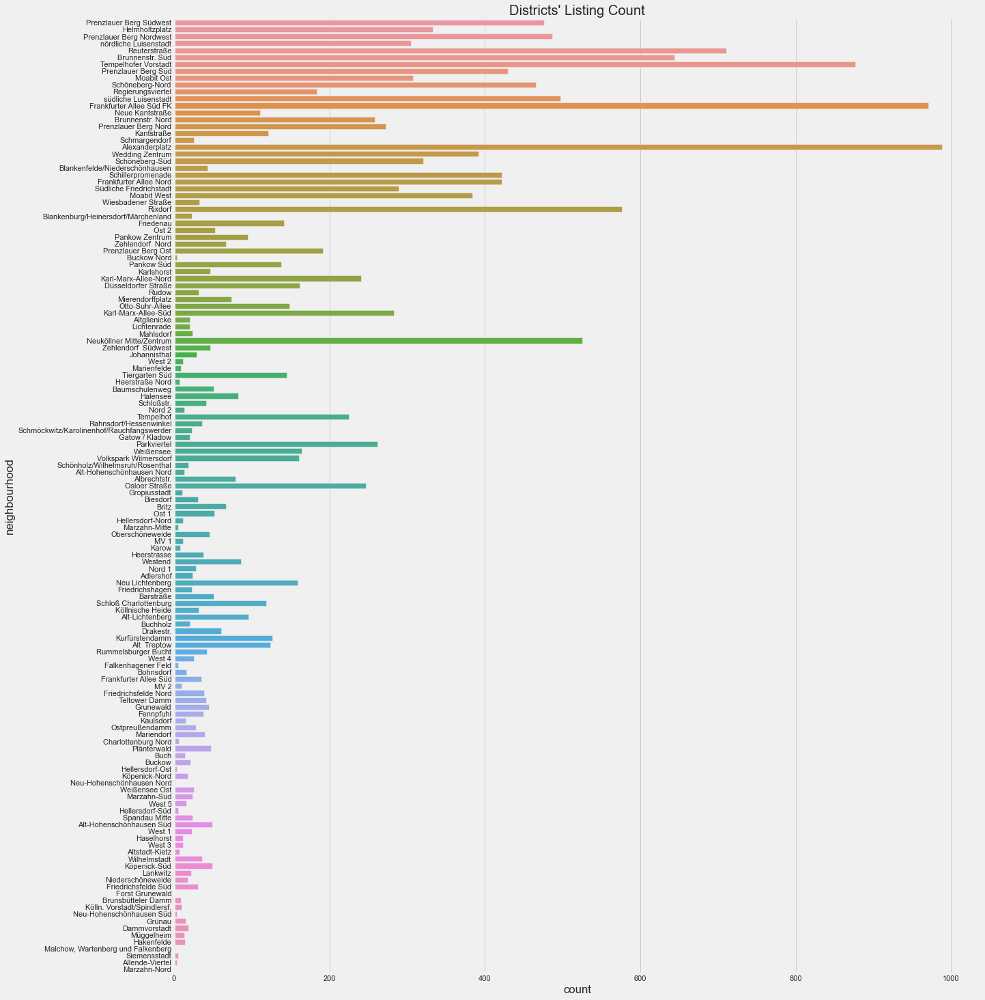

In [22]:
g = sns.catplot(y = 'neighbourhood', kind = 'count', palette = None, height = 20, aspect = 1, data = berlin);
g.savefig('neighbourhood_count.png', dpi = 800)
plt.style.use('fivethirtyeight')
plt.title("Districts' Listing Count")

Most popular districts are **Alexanderplatz, Frankfurter* Allee Süd, Tempelhofer Vorstadt, ReuterStrasse,Rixdorf and Neuköllner Mitte/Zentrum.** All of them are very central and very close to touristic areas. We can suspect that being near to popular places is an important factor for Airbnb rentals. We will seek this question in further.

Listings colored by neighbourhood on a basic map :

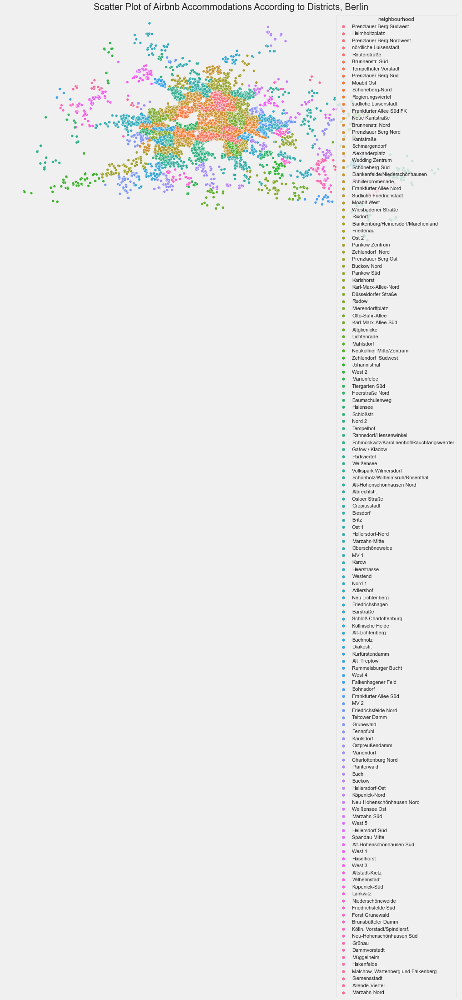

In [113]:
fig = plt.figure(figsize=(16,9))
plt.style.use('fivethirtyeight')
sns.scatterplot(x = 'longitude', y = 'latitude', data = berlin, hue = 'neighbourhood')
plt.xlabel('')
plt.xticks([])
plt.ylabel('')
plt.yticks([])
plt.title('Scatter Plot of Airbnb Accommodations According to Districts, Berlin')
plt.show()
fig.savefig('Berlin_by_districts.png', dpi = 1600)

Let's find latitude and longitude centers for Folium map.

In [36]:
lat=berlin.latitude.mean()
lat

52.50998355770343

In [37]:
long=berlin.longitude.mean()
long

13.404987116430856

### Heatmap According to Listing Count

In [94]:
map_folium = folium.Map([lat,long],zoom_start=10.4)
HeatMap(berlin[['latitude','longitude']].dropna(),radius=8,gradient={0.2:'yellow',0.4:'purple',0.6:'orange',0.8:'black'}).add_to(map_folium)
display(map_folium)



We can conclude from this graph that listings’ locations are correlated with current population’s distribution.

### WordCloud

There are 11474003 words in the combination of all review.


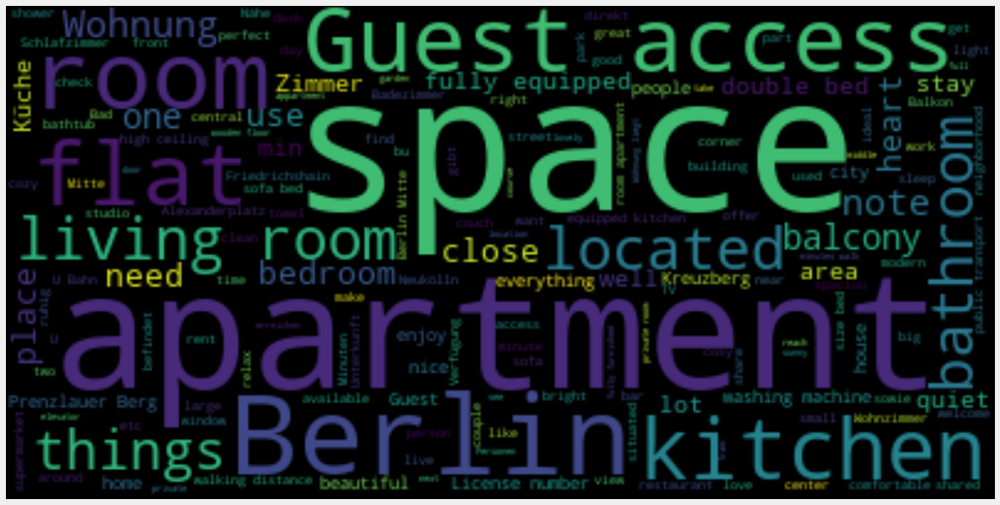

In [57]:
import nltk
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(str(description) for description in berlin.description)
stop_word_list1 = nltk.corpus.stopwords.words('english')
stop_word_list2 = nltk.corpus.stopwords.words('german')
stop_word_list1.extend(stop_word_list2)
stop_word_list1.append("br")
stop_word_list1.append("b")
stop_word_list1.append("thing")
print ("There are {} words in the combination of all review.".format(len(text)))
# Generate a word cloud image
wordcloud = WordCloud(stopwords=stop_word_list1, background_color="black").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()
wordcloud.to_file("wordcloud_berlin.png")

## 3. Data Analyses - Answering the Questions

## QUESTION 1
### In which districts shared houses are popular?
### In which districts hotels are more common in listings?
### In which districts shared houses are unpopular?

In [58]:
berlin.room_type.value_counts()


Entire home/apt    9891
Private room       7233
Shared room         211
Hotel room          165
Name: room_type, dtype: int64

Text(0.5, 1.0, 'Room Type Count')

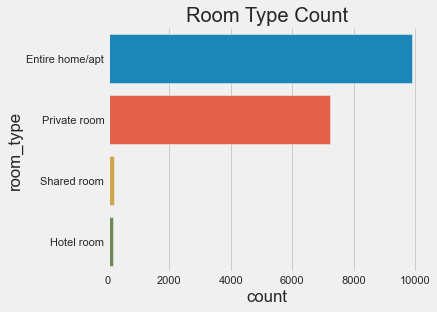

In [59]:
g = sns.catplot(y = 'room_type', kind = 'count', palette = None, height = 4, aspect = 1.5, data = berlin);
g.savefig('room_type.png', dpi = 800)
plt.title("Room Type Count")

In [108]:
berlin_map = folium.Map(location=[lat,long], zoom_start=11, control_scale=True)


In [109]:
def create_scatter_plot_map(df,hue_column,berlin_map):
    '''Takes a df and column and base map,  returns a geomap accord to latitude and longitude values'''
    fig = plt.figure(figsize=(16,9))
    #plot the base map
    nyc_img = plt.imread(berlin_map, 0)
    plt.imshow(nyc_img, extent = [lat-0.13, lat+0.03, long-0.13, long+0.03])
    #make passive on autoscale
    plt.autoscale(False)
    
    #draw a scatterplot with longitude and latitude values for dataframe
    g = sns.scatterplot(x = 'longitude', y = 'latitude', data = df, hue = hue_column)
    g.set(ylim=(long-0.13, long+0.03))
    g.set(xlim=(lat-0.13, lat+0.03))
    plt.xlabel('')
    plt.xticks([])
    plt.ylabel('')
    plt.yticks([])
    plt.title("Scatter Plot of Airbnb Accommodations According to "+ str(hue_column) +"s, Berlin")
    plt.show()

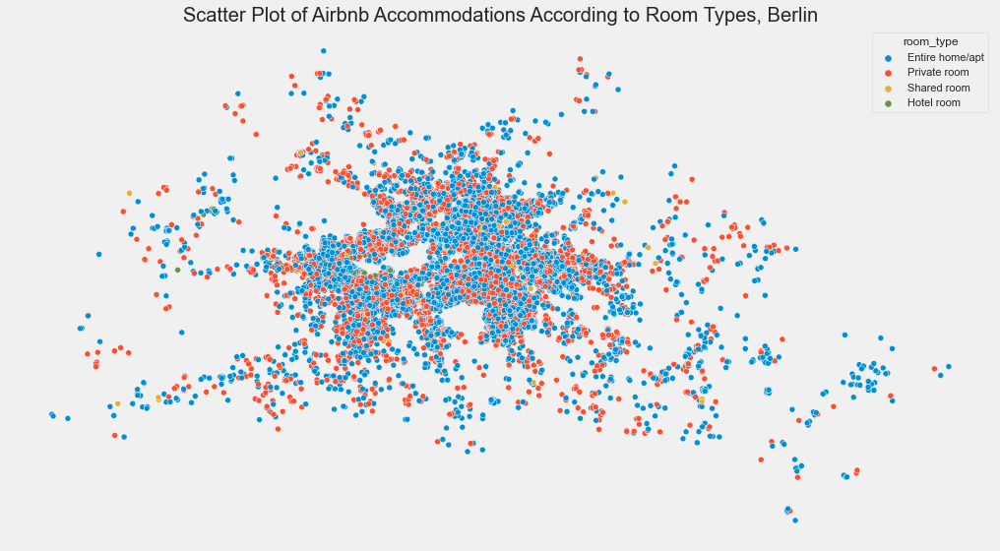

In [114]:
fig = plt.figure(figsize=(16,9))
plt.style.use('fivethirtyeight')
sns.scatterplot(x = 'longitude', y = 'latitude', data = berlin, hue = 'room_type')
plt.xlabel('')
plt.xticks([])
plt.ylabel('')
plt.yticks([])
plt.title('Scatter Plot of Airbnb Accommodations According to Room Types, Berlin')
plt.show()
fig.savefig('Berlin_by_room_type.png', dpi = 1600)

In [115]:
df = berlin.groupby(["neighbourhood","room_type"]).size().unstack('room_type', fill_value=0)
df["total_listings"] = df["Hotel room"] + df["Private room"]+df["Entire home/apt"] + df["Shared room"]
df["shared_house_rate"] = ( df["Shared room"] + df["Private room"] ) / (df["Hotel room"] + df["Private room"]+df["Entire home/apt"]+df["Shared room"])
df["hotel_rate"] = ( df["Hotel room"] ) / (df["Hotel room"] + df["Private room"]+df["Entire home/apt"]+df["Shared room"])
df["entire_home_rate"] = ( df["Entire home/apt"] ) / (df["Hotel room"] + df["Private room"]+df["Entire home/apt"]+df["Shared room"])

Let's answer the 1st question:

In [116]:
df1 = df[df.total_listings >= 50].sort_values(by=["shared_house_rate"],ascending=False)
df1.head(10)

room_type,Entire home/apt,Hotel room,Private room,Shared room,total_listings,shared_house_rate,hotel_rate,entire_home_rate
neighbourhood,,,,,,,,
Baumschulenweg,17,0,34,0,51,0.666667,0.000000,0.333333
Alt-Lichtenberg,35,0,59,2,96,0.635417,0.000000,0.364583
Westend,32,2,49,3,86,0.604651,0.023256,0.372093
Neuköllner Mitte/Zentrum,241,0,284,0,525,0.540952,0.000000,0.459048
Rixdorf,266,0,309,1,576,0.538194,0.000000,0.461806
Wedding Zentrum,182,1,200,9,392,0.533163,0.002551,0.464286
Moabit West,180,0,198,6,384,0.531250,0.000000,0.468750
Osloer Straße,112,4,128,3,247,0.530364,0.016194,0.453441
Karl-Marx-Allee-Süd,132,2,125,24,283,0.526502,0.007067,0.466431


We will exclude districts which have less than 50 listings. We can clearly see that **Baumschulenweg, Alt-Lichtenberg, Westend, Neuköllner Mitte/Zentrum and Rixdorf** have high rates of shared house listings. Since these areas have higher rental prices for local people too, hosts tend to rent homes not fully but partly. This may help them make more profit.

In [117]:
df2= df[df.total_listings >= 50].sort_values(by=["hotel_rate"],ascending=False)
df2.head(10)

room_type,Entire home/apt,Hotel room,Private room,Shared room,total_listings,shared_house_rate,hotel_rate,entire_home_rate
neighbourhood,,,,,,,,
Kurfürstendamm,65,12,48,2,127,0.393701,0.094488,0.511811
Tiergarten Süd,74,11,60,0,145,0.413793,0.075862,0.510345
Volkspark Wilmersdorf,88,10,62,1,161,0.391304,0.062112,0.546584
Otto-Suhr-Allee,92,8,47,2,149,0.328859,0.053691,0.617450
Halensee,65,4,14,0,83,0.168675,0.048193,0.783133
Friedenau,73,6,60,3,142,0.443662,0.042254,0.514085
Schöneberg-Nord,229,17,216,4,466,0.472103,0.036481,0.491416
Neue Kantstraße,64,4,42,1,111,0.387387,0.036036,0.576577
Regierungsviertel,132,5,47,0,184,0.255435,0.027174,0.717391


**Kurfürstendamm** is the one of the most touristic districts in Germnay. Seeing highest hotel rate in this district is not surprising.

In [118]:
df3= df[df.total_listings >= 50].sort_values(by=["shared_house_rate"],ascending=True)
df3.head(10)

room_type,Entire home/apt,Hotel room,Private room,Shared room,total_listings,shared_house_rate,hotel_rate,entire_home_rate
neighbourhood,,,,,,,,
Halensee,65,4,14,0,83,0.168675,0.048193,0.783133
Brunnenstr. Süd,497,10,136,1,644,0.212733,0.015528,0.771739
Regierungsviertel,132,5,47,0,184,0.255435,0.027174,0.717391
Prenzlauer Berg Südwest,327,11,135,3,476,0.289916,0.023109,0.686975
Helmholtzplatz,228,0,102,3,333,0.315315,0.000000,0.684685
Alexanderplatz,655,14,272,47,988,0.322874,0.014170,0.662955
Otto-Suhr-Allee,92,8,47,2,149,0.328859,0.053691,0.617450
Prenzlauer Berg Süd,280,5,143,2,430,0.337209,0.011628,0.651163
Düsseldorfer Straße,105,2,55,0,162,0.339506,0.012346,0.648148


**Halensee, Brunnenstr. Süd, Regierungsviertel and Prenzlauer Berg Südwest**  have lowest "shared house rate". In this areas sharing a home seems not popular.

## QUESTION 2
### What are the top districts for review value score?

C:\Users\OBO\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(0.0, 20.0)

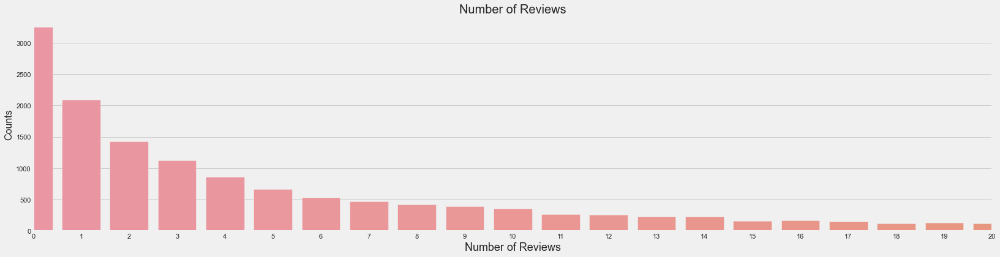

In [120]:
sns.countplot(berlin['number_of_reviews'])
fig = plt.gcf()
plt.style.use('fivethirtyeight')
fig.set_size_inches(25, 6)
plt.title('Number of Reviews',fontsize=20)
plt.xlabel('Number of Reviews', fontsize=18)
plt.ylabel('Counts', fontsize=16)
plt.xlim(0,20)

Most listings have zero reviews. For these question, we will evaluate only accommodations which have reviews.

In [121]:
berlin[berlin.review_scores_value.notnull()]["review_scores_value"].describe()

count    13909.000000
mean         2.335435
std          0.218285
min          0.500000
25%          2.275000
50%          2.380000
75%          2.500000
max          2.500000
Name: review_scores_value, dtype: float64

13909 listing have review value score, mean value 2.33. Lets see distribution for this column:

C:\Users\OBO\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


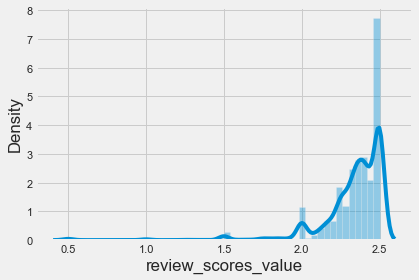

In [122]:
sns.distplot(berlin[(berlin.review_scores_value.notnull())]["review_scores_value"]);

In [126]:
berlin[berlin.review_scores_value.notnull()].groupby("neighbourhood").agg({"review_scores_value": [ "mean","count"]}).reset_index().sort_values(by=[("review_scores_value","mean")],ascending=False).head(20)


neighbourhood review_scores_value      
                                                        mean count
79             Neu-Hohenschönhausen Nord            2.500000     1
49                       Hellersdorf-Süd            2.440000     4
30                       Forst Grunewald            2.440000     1
65                                  MV 1            2.432778     9
48                       Hellersdorf-Ost            2.430000     3
0                              Adlershof            2.426842    19
15                             Bohnsdorf            2.426111     9
67                             Mahlsdorf            2.425625    24
66                                  MV 2            2.425500    10
84                                Nord 1            2.418261    23
70                           Marienfelde            2.416667     6
77                            Müggelheim            2.414000    10
56                                 Karow            2.412500     6
20                                  Buch            2.405500    10
83                     Niederschöneweide            2.405000    15
71                         Marzahn-Mitte            2.405000     3
110                        Schmargendorf            2.404444    18
39                          Gropiusstadt            2.403889     9
13   Blankenburg/Heinersdorf/Märchenland            2.400750    20
92                            Pankow Süd            2.400474   116

We can state that Adlershof, Bohnsdorf, Mahlsdorf,MV 2 and Nord 1 have highest review value score for districts which have at least 8 listings with reviews.

## QUESTION 3
### Is price range distribution different for top 6 districts? Is it statistically significant?

C:\Users\OBO\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


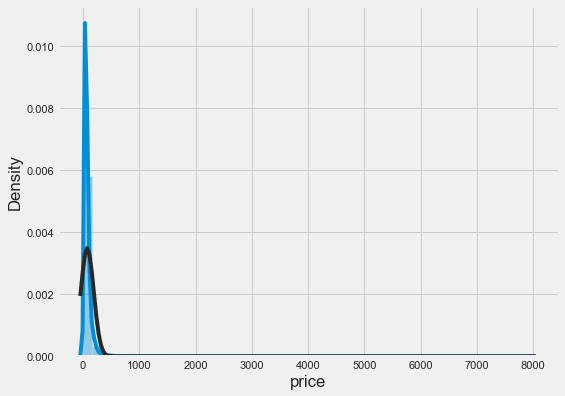

In [127]:
plt.figure(figsize=(8,6))
plt.style.use('fivethirtyeight')
sns.distplot(berlin['price'],fit=norm);

C:\Users\OBO\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 0, 'log-price')

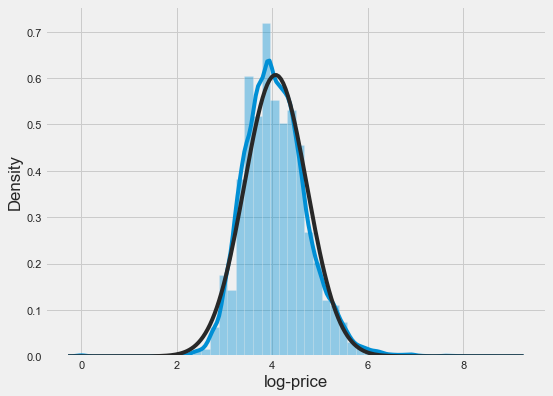

In [129]:
plt.figure(figsize=(8,6))
plt.style.use('fivethirtyeight')
sns.distplot(np.log1p(berlin[berlin.price.notnull()]['price']),fit=norm)
plt.xlabel("log-price")

Limit price to 100 max and check the distribution again:

C:\Users\OBO\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


(0.0, 100.0)

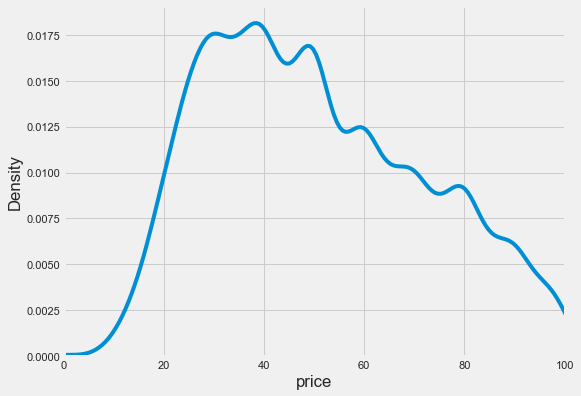

In [135]:
plt.figure(figsize=(8,6))
plt.style.use('fivethirtyeight')
sns.distplot(berlin[berlin.price <100].price,hist=False)
plt.xlim(0,100)

Lets have a look on top 6 expensive place. If we check website with rent id's we can easily see that there are some data or host mistakes for these prices.

In [136]:
berlin.sort_values(by=["price"],ascending=False).head(6)


,id,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,description,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
15353,45274790,361836933,Tempelhofer Vorstadt,52.48868,13.39500,Private room,8000,2,0,2,16,Cozy room in one of the popular areas of Berli...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17261,52161838,422272493,Fennpfuhl,52.52889,13.48028,Entire home/apt,5000,70,5,1,0,Die Wohnung ist nur bis Ende November verfügba...,5.0,5.00,2.5,2.5,2.500,2.500,2.500
15435,45478806,11674720,Reuterstraße,52.48653,13.43921,Private room,4000,2,0,2,90,Discover what made a stay here so unforgettabl...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13293,39877586,307093950,Schöneberg-Nord,52.49805,13.34874,Entire home/apt,3000,1,0,1,86,"wir bieten für Film- Fotoshootings, geschäftli...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
7090,19961235,102979040,Alexanderplatz,52.52267,13.39935,Entire home/apt,2517,2,8,13,340,The 5 star penthouse unites elegance and varie...,5.0,5.00,2.5,2.5,2.500,2.500,2.375
1134,2860420,14623546,Tempelhofer Vorstadt,52.49185,13.41961,Entire home/apt,2500,1,19,1,89,"For rent for photoshoots, during week days, f...",5.0,4.93,2.5,2.5,2.465,2.435,2.300


It seems like we have outlier values.

In [137]:
berlin.price.describe()

count    17500.000000
mean        74.904857
std        114.235123
min          0.000000
25%         35.000000
50%         55.000000
75%         85.000000
max       8000.000000
Name: price, dtype: float64

#### Find the outliers with 2 standart deviations from mean and exclude them from price analysis.

In [139]:
from numpy import mean
from numpy import std

# calculate summary statistics
data_mean, data_std = mean(berlin.price), std(berlin.price)
# identify outliers
cut_off = data_std * 2
lower, upper = data_mean - cut_off, data_mean + cut_off
# identify outliers
outliers = [x for x in berlin.price if x < lower or x > upper]
print('Identified outliers: %d' % len(outliers))
# remove outliers
outliers_removed = [x for x in berlin.price if x >= lower and x <= upper]
print('Non-outlier observations: %d' % len(outliers_removed))
print('Lower and upper bounds: %d' % lower , upper)

Identified outliers: 219
Non-outlier observations: 17281
Lower and upper bounds: -153 303.36857434333785


In [140]:
berlin[(berlin.price >= lower)&(berlin.price <= upper)].shape

(17281, 19)

#### Create a dataframe by excluding outlier points

In [193]:
berlin_price = berlin[(berlin.price > lower)&(berlin.price < upper)].copy()
berlin_price

,id,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,description,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,3176,3718,Prenzlauer Berg Südwest,52.534710,13.418100,Entire home/apt,90,62,147,1,114,This beautiful first floor apartment is situa...,4.63,4.68,2.265,2.320,2.345,2.460,2.315
1,7071,17391,Helmholtzplatz,52.543010,13.415340,Private room,33,1,293,1,0,Cozy and large room in the beautiful district ...,4.83,4.85,2.450,2.430,2.425,2.455,2.355
2,9991,33852,Prenzlauer Berg Südwest,52.532690,13.418050,Entire home/apt,180,6,8,1,0,4 bedroom with very large windows and outstand...,5.00,5.00,2.500,2.500,2.500,2.430,2.430
3,14325,55531,Prenzlauer Berg Nordwest,52.548130,13.403660,Entire home/apt,70,95,26,3,132,The apartment is located on the upper second f...,4.67,5.00,2.420,2.340,2.420,2.290,2.210
4,16644,64696,nördliche Luisenstadt,52.503120,13.435080,Entire home/apt,90,60,48,2,175,Light and sunny 2-Room-turn of the century-fla...,4.72,4.86,2.430,2.465,2.430,2.335,2.355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17495,52880839,425274576,Pankow Süd,52.560842,13.423846,Entire home/apt,109,3,0,2,52,"AUSSTATTUNG und SERVICE mit Bad, Dusche, WC, F...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
17496,52888769,47038452,Neuköllner Mitte/Zentrum,52.469050,13.439410,Entire home/apt,40,1,0,1,246,Wir vermieten unsere schöne Altbau Wohnung im ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17497,52889090,125847915,Parkviertel,52.551306,13.349517,Entire home/apt,98,1,0,17,175,Enjoy freedom and flexibility. Homaris apartme...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17498,52895114,390717918,Moabit Ost,52.532630,13.351077,Entire home/apt,90,1,0,2,360,perfect place for two to experience Berlin Cit...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [195]:
berlin_price.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
count,1.728100e+04,1.728100e+04,17281.000000,17281.000000,17281.00000,17281.000000,17281.000000,17281.000000,17281.000000,14099.000000,13788.000000,13780.000000,13767.000000,13777.000000,13768.000000,13765.000000
mean,2.534168e+07,9.256271e+07,52.509955,13.405226,67.80846,10.063191,23.495052,2.974191,81.001794,4.625620,4.790948,2.320424,2.413719,2.415721,2.381012,2.335689
std,1.538129e+07,1.076327e+08,0.032523,0.063236,46.76569,35.124795,52.233519,7.321710,122.877437,0.803752,0.415858,0.257426,0.184481,0.186908,0.182595,0.218546
min,3.176000e+03,1.581000e+03,52.340070,13.097150,0.00000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.500000,0.500000,0.500000,0.500000,0.500000
25%,1.197494e+07,1.202496e+07,52.489550,13.368170,35.00000,2.000000,1.000000,1.000000,0.000000,4.600000,4.750000,2.250000,2.400000,2.405000,2.335000,2.275000
50%,2.342573e+07,4.325775e+07,52.509730,13.414830,55.00000,3.000000,5.000000,1.000000,0.000000,4.850000,4.920000,2.400000,2.475000,2.485000,2.440000,2.385000
75%,3.935980e+07,1.426446e+08,52.533240,13.439210,84.00000,5.000000,18.000000,2.000000,143.000000,5.000000,5.000000,2.500000,2.500000,2.500000,2.500000,2.500000
max,5.290040e+07,4.277484e+08,52.656110,13.763330,300.00000,1124.000000,683.000000,75.000000,365.000000,5.000000,5.000000,2.500000,2.500000,2.500000,2.500000,2.500000


In [146]:
# create a LinearColorMap and assign colors, vmin, and vmax
colormap = cm.LinearColormap(colors=['green', 'yellow', 'red'], vmin=berlin_price.price.min(), vmax=berlin_price.price.max())

m = folium.Map(location=[long,lat] , zoom_start=20)

# go through each rentals in set, make circle, and add to map.
for i in range(len(berlin_price)):
    folium.Circle(
        location=[berlin_price.iloc[i]['latitude'], berlin_price.iloc[i]['longitude']],
        radius=10, color=colormap(berlin_price.iloc[i]['price'])).add_to(m)

m.add_child(colormap)
display(m)

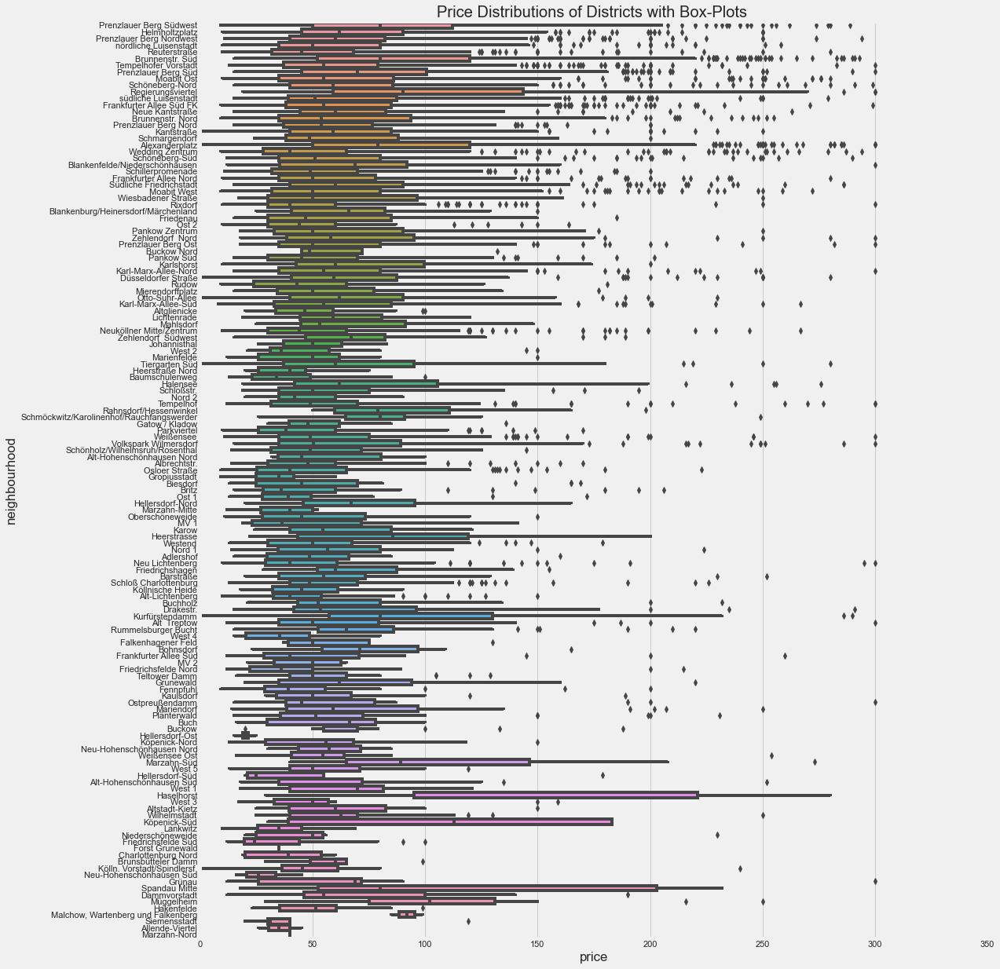

In [152]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(16,20))
sns.boxplot(y='neighbourhood',x='price',data = berlin_price)
plt.title('Price Distributions of Districts with Box-Plots ')
plt.xlim((0,350))
plt.show()

In [ ]:
Alexdarplatz, Frankfurter Allee Süd, Tempelhofer Vorstadt, ReuterStrasse,Rixdorf and Neuköllner Zentrum/ Mitte

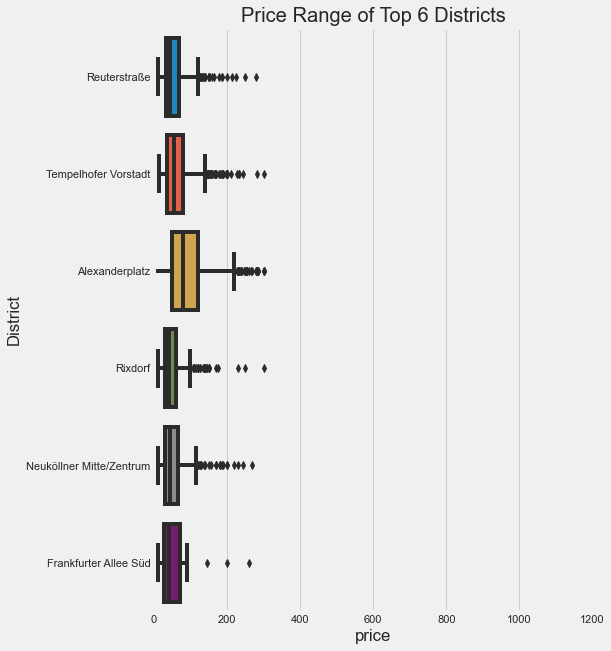

In [158]:
top_districts = ["Alexanderplatz","Frankfurter Allee Süd","Tempelhofer Vorstadt","Reuterstraße","Rixdorf","Neuköllner Mitte/Zentrum"]
plt.style.use('fivethirtyeight')
plt.figure(figsize=(7,10))
sns.boxplot(y='neighbourhood',x='price',data = berlin_price[berlin_price.neighbourhood.isin(top_districts)])
plt.title('Price Range of Top 6 Districts')
plt.ylabel("District")
plt.xlim((0,1200))
plt.show()

### ANOVA Test to see there is a difference for district means in top districts.

H0 (null hypothesis): mean_price(Alexanderplatz) = mean_price(Frankfurter Allee Süd) = mean_price(Tempelhofer Vorstadt)= mean_price(Reuterstraße) = mean_price(Rixdorf)=mean_price(Neuköllner Mitte/Zentrum)

H1 (alternate hypothesis): mean_price(Besiktas) != mean_price(Beyoglu) != mean_price(Sisli)!= mean_price(Fatih) != mean_price(Kadikoy)!=mean_price(Neuköllner Mitte/Zentrum)

In [166]:
import scipy.stats as st

In [167]:
alexanderplatz = berlin_price[berlin_price['neighbourhood'] == 'Alexanderplatz']
frankfurter_Allee_Süd = berlin_price[berlin_price['neighbourhood'] == 'Frankfurter Allee Süd']
tempelhofer_Vorstadt = berlin_price[berlin_price['neighbourhood'] == 'Tempelhofer Vorstadt']
reuterstrasse = berlin_price[berlin_price['neighbourhood'] == 'Reuterstraße']
rixdorf = berlin_price[berlin_price['neighbourhood'] == 'Rixdorf'] 
neuköllner_Mitte_Zentrum = berlin_price[berlin_price['neighbourhood'] == 'Neuköllner Mitte/Zentrum']

In [168]:
st.f_oneway(alexanderplatz.price,frankfurter_Allee_Süd.price,tempelhofer_Vorstadt.price,reuterstrasse.price,rixdorf.price,neuköllner_Mitte_Zentrum.price)

F_onewayResult(statistic=116.2099384027555, pvalue=2.283816900248427e-114)

We can clearly state that at least one district is different than others. P value is less than alpha=0.05 and null hypthesis is rejected.

In [169]:
berlin_price['price_range'] = pd.qcut(berlin_price['price'], q=5)

In [171]:
berlin_price.price_range.value_counts()

(46.0, 65.0]      3720
(-0.001, 32.0]    3486
(94.0, 300.0]     3448
(32.0, 46.0]      3448
(65.0, 94.0]      3179
Name: price_range, dtype: int64

In [ ]:
create_scatter_plot_map(berlin_price,"price_range",'Location_map_Istanbul.png')

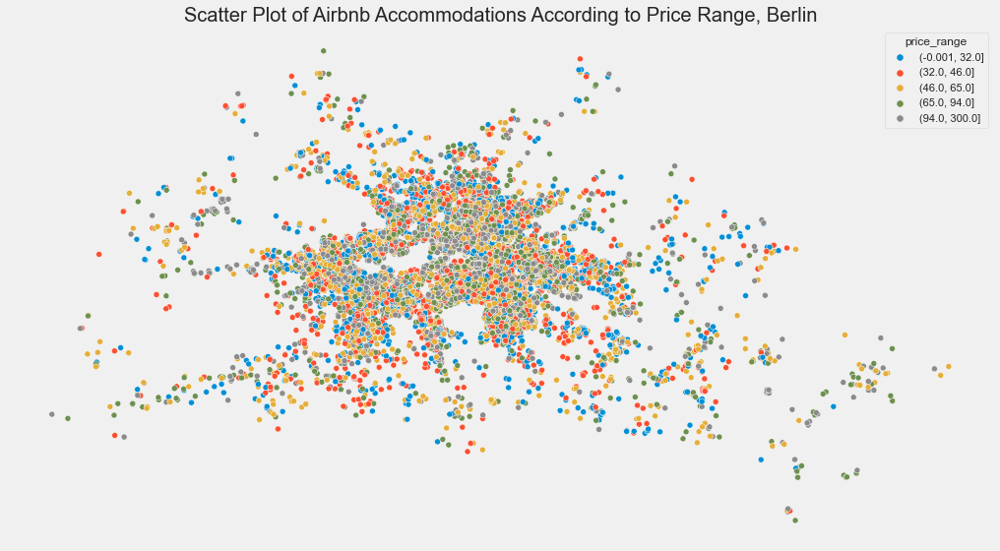

In [172]:
fig = plt.figure(figsize=(16,9))
plt.style.use('fivethirtyeight')
sns.scatterplot(x = 'longitude', y = 'latitude', data = berlin_price, hue = 'price_range')
plt.xlabel('')
plt.xticks([])
plt.ylabel('')
plt.yticks([])
plt.title('Scatter Plot of Airbnb Accommodations According to Price Range, Berlin')
plt.show()
fig.savefig('Berlin_by_Price_Range.png', dpi = 1600)

## QUESTION 4
### Is distance to touristic areas effecting the price?

In [180]:
touristic_places = {"Reichstag":[(52.519286105514944, 13.37588679259562)],"Brandenburg Gate":[(52.516343170353906, 13.377702721526662)],
                        "Fernsehturm":[(52.52095469377197, 13.409463934212743)], "Gendarmenmarkt":[(52.51385296487602, 13.39270198421239)],
                         "Kurfürstendamm":[(52.504563245705654, 13.335384584211964)],"Charlottenburg Palace":[(52.52105591527928, 13.295605768869255)],
                    "Museum Island":[(52.51756256628977, 13.40184055635929)],
                          "Visitor center of the Berlin Wall Memorial":[(52.53393381031915, 13.387457526541574)]}

In [181]:
touristic_places.keys()

dict_keys(['Reichstag', 'Brandenburg Gate', 'Fernsehturm', 'Gendarmenmarkt', 'Kurfürstendamm', 'Charlottenburg Palace', 'Museum Island', 'Visitor center of the Berlin Wall Memorial'])

In [182]:
berlin_price.head()


,id,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,...,review_scores_value,price_range,distance_to_Reichstag,distance_to_Brandenburg Gate,distance_to_Fernsehturm,distance_to_Gendarmenmarkt,distance_to_Kurfürstendamm,distance_to_Charlottenburg Palace,distance_to_Museum Island,distance_to_Kadikoy
0,3176,3718,Prenzlauer Berg Südwest,52.53471,13.41810,Entire home/apt,90,62,147,1,...,2.315,"(65.0, 94.0]",3.339722,3.419741,1.639031,2.891064,6.540545,8.451052,2.204245,2.081110
1,7071,17391,Helmholtzplatz,52.54301,13.41534,Private room,33,1,293,1,...,2.355,"(32.0, 46.0]",3.760004,3.915312,2.486441,3.589889,6.910443,8.484586,2.976229,2.144564
2,9991,33852,Prenzlauer Berg Südwest,52.53269,13.41805,Entire home/apt,180,6,8,1,...,2.430,"(94.0, 300.0]",3.227013,3.287565,1.429992,2.711795,6.425300,8.410381,2.010966,2.080580
3,14325,55531,Prenzlauer Berg Nordwest,52.54813,13.40366,Entire home/apt,70,95,26,3,...,2.210,"(65.0, 94.0]",3.722082,3.951490,3.049538,3.886075,6.706368,7.927050,3.403706,1.924564
4,16644,64696,nördliche Luisenstadt,52.50312,13.43508,Entire home/apt,90,60,48,2,...,2.355,"(65.0, 94.0]",4.403053,4.164272,2.638776,3.115374,6.771653,9.677181,2.770534,4.712482


In [183]:
for i in touristic_places.keys():
    berlin_price["distance_to_"+str(i)] = berlin_price.apply(lambda x:geodesic((x["latitude"], 
                    x["longitude"]), touristic_places[i][0]).kilometers, axis=1)

In [184]:
berlin_price['minimum_distance'] = berlin_price[['distance_to_Reichstag','distance_to_Brandenburg Gate',
                             'distance_to_Fernsehturm', "distance_to_Gendarmenmarkt","distance_to_Kurfürstendamm",
                              'distance_to_Charlottenburg Palace',"distance_to_Museum Island","distance_to_Visitor center of the Berlin Wall Memorial"]].min(axis=1).round(2)

In [185]:
berlin_price.head()

,id,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,...,distance_to_Reichstag,distance_to_Brandenburg Gate,distance_to_Fernsehturm,distance_to_Gendarmenmarkt,distance_to_Kurfürstendamm,distance_to_Charlottenburg Palace,distance_to_Museum Island,distance_to_Kadikoy,distance_to_Visitor center of the Berlin Wall Memorial,minimum_distance
0,3176,3718,Prenzlauer Berg Südwest,52.53471,13.41810,Entire home/apt,90,62,147,1,...,3.339722,3.419741,1.639031,2.891064,6.540545,8.451052,2.204245,2.081110,2.081110,1.64
1,7071,17391,Helmholtzplatz,52.54301,13.41534,Private room,33,1,293,1,...,3.760004,3.915312,2.486441,3.589889,6.910443,8.484586,2.976229,2.144564,2.144564,2.14
2,9991,33852,Prenzlauer Berg Südwest,52.53269,13.41805,Entire home/apt,180,6,8,1,...,3.227013,3.287565,1.429992,2.711795,6.425300,8.410381,2.010966,2.080580,2.080580,1.43
3,14325,55531,Prenzlauer Berg Nordwest,52.54813,13.40366,Entire home/apt,70,95,26,3,...,3.722082,3.951490,3.049538,3.886075,6.706368,7.927050,3.403706,1.924564,1.924564,1.92
4,16644,64696,nördliche Luisenstadt,52.50312,13.43508,Entire home/apt,90,60,48,2,...,4.403053,4.164272,2.638776,3.115374,6.771653,9.677181,2.770534,4.712482,4.712482,2.64


In [186]:
berlin_price['price'].corr(berlin_price['minimum_distance'])

-0.10169312206404048

We can see clearly there is a strong correlation between the distince and price.

Create a categorical variable based on minimum distance. We will divide feature's value to 5 bins and name these categories.

In [187]:
names = ['very close', 'close', 'middle', 'far', 'very far']
berlin_price['distance_category'] = pd.qcut(berlin_price['minimum_distance'], 5, labels=names)

In [188]:
berlin_price.head()


,id,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,...,distance_to_Brandenburg Gate,distance_to_Fernsehturm,distance_to_Gendarmenmarkt,distance_to_Kurfürstendamm,distance_to_Charlottenburg Palace,distance_to_Museum Island,distance_to_Kadikoy,distance_to_Visitor center of the Berlin Wall Memorial,minimum_distance,distance_category
0,3176,3718,Prenzlauer Berg Südwest,52.53471,13.41810,Entire home/apt,90,62,147,1,...,3.419741,1.639031,2.891064,6.540545,8.451052,2.204245,2.081110,2.081110,1.64,close
1,7071,17391,Helmholtzplatz,52.54301,13.41534,Private room,33,1,293,1,...,3.915312,2.486441,3.589889,6.910443,8.484586,2.976229,2.144564,2.144564,2.14,close
2,9991,33852,Prenzlauer Berg Südwest,52.53269,13.41805,Entire home/apt,180,6,8,1,...,3.287565,1.429992,2.711795,6.425300,8.410381,2.010966,2.080580,2.080580,1.43,very close
3,14325,55531,Prenzlauer Berg Nordwest,52.54813,13.40366,Entire home/apt,70,95,26,3,...,3.951490,3.049538,3.886075,6.706368,7.927050,3.403706,1.924564,1.924564,1.92,close
4,16644,64696,nördliche Luisenstadt,52.50312,13.43508,Entire home/apt,90,60,48,2,...,4.164272,2.638776,3.115374,6.771653,9.677181,2.770534,4.712482,4.712482,2.64,middle


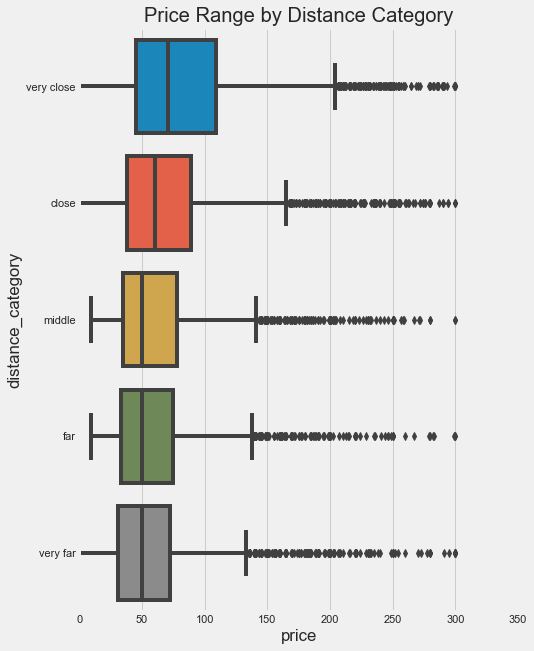

In [190]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(7,10))
sns.boxplot(y='distance_category',x='price',data = berlin_price)
plt.title('Price Range by Distance Category')
plt.xlim(0,350)
plt.show()

In [191]:
very_close = berlin_price[berlin_price['distance_category'] == 'very close']
close = berlin_price[berlin_price['distance_category'] == 'close']
middle = berlin_price[berlin_price['distance_category'] == 'middle']
far = berlin_price[berlin_price['distance_category'] == 'far']
very_far = berlin_price[berlin_price['distance_category'] == 'very far']

We make an ANOVA test to see a difference for mean price in categories based on distance metric we calculated.

H0 (null hypothesis): mean_price(very_close) = mean_price(close) = mean_price(middle) = mean_price(far) = mean_price(very_far)

H1 (alternate hypothesis): mean_price(very_close) != mean_price(close) != mean_price(middle) != mean_price(far) != mean_price(very_far)

In [192]:
st.f_oneway(very_close.price, close.price, middle.price, far.price,very_far.price)

F_onewayResult(statistic=213.87931260659235, pvalue=1.956264733818211e-179)

Since p-value is very less than alpha=0.05 we can conclude that one group's mean price is different than other groups.

## 4. Evaluation - Findings
 - Alexanderplatz, Frankfurter* Allee Süd, Tempelhofer Vorstadt, ReuterStrasse,Rixdorf and Neuköllner Mitte/Zentrum  have most listing counts, total listing number of these districts cover 27.25% of all listings.
 
 
 - Kurfürstendamm is one of the most touristic districts in Berlin which have most of the sightseeing places and  shops, houses, hotels and restaurants.The broad, long boulevard can be considered the Champs-Élysées of Berlin and  seeing highest hotel rate in this district is not surprising.
 
 
 - Halensee, Brunnenstr. Süd, Regierungsviertel and Prenzlauer Berg Südwest  have highest "entire home rate". In these districts home sharing seems not popular. On the other hand,Baumschulenweg, Alt-Lichtenberg, Westend, Neuköllner Mitte/Zentrum and Rixdorf have highest "shared home rate" Since these areas have higher rental prices for local people too, hosts tend to rent homes not fully but partly. This may help them make more profit.
 
 
 - Adlershof, Bohnsdorf, Mahlsdorf,MV 2 and Nord 1 have highest review value score for districts which have at least 8 listings with reviews.
 
 
 - 95% of the daily price values distributed between 0 and 300 Euro.
 
 
 -  Alexanderplatz,Frankfurter Allee Süd,Tempelhofer Vorstadt,Reuterstraße,Rixdorf,Neuköllner Mitte/Zentrum  are evaluated with ANOVA test according to their price mean. At least one group has different mean price according to statistical ANOVA test.
 

 - Distances to 8 most touristic places are calculated and min value used for minimum distance feature. Correlation test show a strong  direct correlation. When we assign a category to the locations according to their minimum distance, we can conclude that at least one group's price mean is different than others. This can be linked to minimum distance and distance to touristic areas.